### Configuración del ambiente de Google Colaboratory

In [ ]:
# Download Java
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
# Next, we will install Apache Spark 3.0.1 with Hadoop 2.7 from here.
!wget https://dlcdn.apache.org/spark/spark-3.3.2/spark-3.3.2-bin-hadoop3.tgz
# Now, we just need to unzip that folder.
!tar xf spark-3.3.2-bin-hadoop3.tgz

# Setting JVM and Spark path variables
import os 
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.3.2-bin-hadoop3"

# Installing required packages
!pip install pyspark==3.3.2
!pip install findspark

In [ ]:
import datetime as dt
import findspark
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pyspark.ml as ml
from pyspark.sql import functions as fct
from pyspark.sql import SparkSession
from pyspark.sql.types import IntegerType, StringType
findspark.init()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
datos=pd.read_csv("/content/drive/MyDrive/Proyecto Big Data/P_Data_Extract_From_World_Development_Indicators/864783b5-08ea-4ead-8443-30a9c34f473d_Data.csv")
datos.head(10000)

,Country Name,Country Code,Series Name,Series Code,1960 [YR1960],1961 [YR1961],1962 [YR1962],1963 [YR1963],1964 [YR1964],1965 [YR1965],...,2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015],2016 [YR2016],2017 [YR2017],2018 [YR2018],2019 [YR2019],2020 [YR2020],2021 [YR2021]
0,Argentina,ARG,Alternative and nuclear energy (% of total ene...,EG.USE.COMM.CL.ZS,..,..,..,..,..,..,...,5.57056095371141,5.67143015652958,5.50150364266138,..,..,..,..,..,..,..
1,Argentina,ARG,CO2 emissions (metric tons per capita),EN.ATM.CO2E.PC,..,..,..,..,..,..,...,4.26422378235981,4.34211506853729,4.20909563279429,4.30191387639872,4.20184577616112,4.07130836193664,3.97577197057929,3.74065029063396,..,..
2,Argentina,ARG,CO2 emissions from electricity and heat produc...,EN.CO2.ETOT.ZS,..,..,..,..,..,..,...,38.4988415324101,37.4025112008408,38.0385634842264,..,..,..,..,..,..,..
3,Argentina,ARG,CO2 emissions from gaseous fuel consumption (kt),EN.ATM.CO2E.GF.KT,2365.215,4033.7,5111.798,5834.197,6472.255,7253.326,...,95459.344,90835.257,96691.456,98359.941,102268.963,..,..,..,..,..
4,Argentina,ARG,CO2 emissions from gaseous fuel consumption (%...,EN.ATM.CO2E.GF.ZS,4.84525240384615,7.88134986028516,9.51990712285734,11.648850490555,11.6141343686254,12.3216844203576,...,53.4696375959223,49.3669875,53.7443477294203,52.8561131710463,55.4965069459518,..,..,..,..,..
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8781,Data from database: World Development Indicators,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
lista_pais = list(datos['Country Code'].unique())
lista_pais = lista_pais[:lista_pais.index('ZWE')+1]
lista_pais.append("SAH")
print(lista_pais)

['ARG', 'AUS', 'BRA', 'CHN', 'FRA', 'DEU', 'IND', 'IDN', 'ITA', 'JPN', 'KOR', 'MEX', 'NLD', 'RUS', 'SAU', 'ESP', 'CHE', 'TUR', 'GBR', 'USA', 'AFG', 'ALB', 'DZA', 'ASM', 'AND', 'AGO', 'ATG', 'ARM', 'ABW', 'AUT', 'AZE', 'BHS', 'BHR', 'BGD', 'BRB', 'BLR', 'BEL', 'BLZ', 'BEN', 'BMU', 'BTN', 'BOL', 'BIH', 'BWA', 'VGB', 'BRN', 'BGR', 'BFA', 'BDI', 'CPV', 'KHM', 'CMR', 'CAN', 'CYM', 'CAF', 'TCD', 'CHI', 'CHL', 'COL', 'COM', 'COD', 'COG', 'CRI', 'CIV', 'HRV', 'CUB', 'CUW', 'CYP', 'CZE', 'DNK', 'DJI', 'DMA', 'DOM', 'ECU', 'EGY', 'SLV', 'GNQ', 'ERI', 'EST', 'SWZ', 'ETH', 'FRO', 'FJI', 'FIN', 'PYF', 'GAB', 'GMB', 'GEO', 'GHA', 'GIB', 'GRC', 'GRL', 'GRD', 'GUM', 'GTM', 'GIN', 'GNB', 'GUY', 'HTI', 'HND', 'HKG', 'HUN', 'ISL', 'IRN', 'IRQ', 'IRL', 'IMN', 'ISR', 'JAM', 'JOR', 'KAZ', 'KEN', 'KIR', 'PRK', 'XKX', 'KWT', 'KGZ', 'LAO', 'LVA', 'LBN', 'LSO', 'LBR', 'LBY', 'LIE', 'LTU', 'LUX', 'MAC', 'MDG', 'MWI', 'MYS', 'MDV', 'MLI', 'MLT', 'MHL', 'MRT', 'MUS', 'FSM', 'MDA', 'MCO', 'MNG', 'MNE', 'MAR', 'MOZ'

### Crear Sesión de Spark e importar los datos

In [ ]:
ss = (SparkSession
      .builder
      .appName("data_exploration_preparation")
      .getOrCreate())

In [ ]:
WDI = "/content/drive/MyDrive/Proyecto Big Data/P_Data_Extract_From_World_Development_Indicators/864783b5-08ea-4ead-8443-30a9c34f473d_Data.csv"
world_indicators = ss.read.csv(WDI, inferSchema=True, header=True)

In [ ]:
parametros=["EN.ATM.CO2E.KT","EG.ELC.HYRO.ZS","EG.ELC.FOSL.ZS","EG.ELC.RNWX.KH","EG.USE.COMM.FO.ZS","EG.FEC.RNEW.ZS"]
#parametros=[CO2 emissions (kt)	;Electricity production from hydroelectric sources (% of total);Electricity production from oil, gas and coal sources (% of total);
#	Electricity production from renewable sources, excluding hydroelectric (kWh);Fossil fuel energy consumption (% of total);Renewable energy consumption (% of total final energy consumption)]
CountriesData=(world_indicators
               .where(world_indicators["Series Code"].isin(parametros))
               .select(["Country Name","Series Name"]+[f"{i} [YR{i}]" for i in range(1990, 2015, 1)])
                )
CountriesData.show(50)

In [ ]:
valores=np.zeros((len(lista_pais),25,len(parametros)))
for i in range(valores.shape[2]):
  for j in range(valores.shape[1]):
    for k in range(valores.shape[0]):
        val=(world_indicators
                      .where(world_indicators["Series Code"]==parametros[i] )
                      .select([f"{1990+j} [YR{1990+j}]"])
                      .collect()
            )
        if val[k][f"{1990+j} [YR{1990+j}]"]!='..':
          valores[k][j][i]=float(val[k][f"{1990+j} [YR{1990+j}]"])
        else:
          valores[k][j][i]=0

In [ ]:
# fila_ceros = np.zeros((1, 25, 6))
# Concatenar la fila de ceros a la matriz existente
# valores = np.vstack((valores, fila_ceros))

In [ ]:
np.save("/content/drive/MyDrive/Proyecto Big Data/valores",valores)

In [ ]:
valores=np.load("/content/drive/MyDrive/Proyecto Big Data/valores.npy")

In [ ]:
valores.shape

(218, 25, 6)

In [ ]:
years = list(range(1990, 2015))

In [ ]:
C02KT = np.sum(valores[:,:,0],axis=0)
print(C02KT[2])

20515810.0


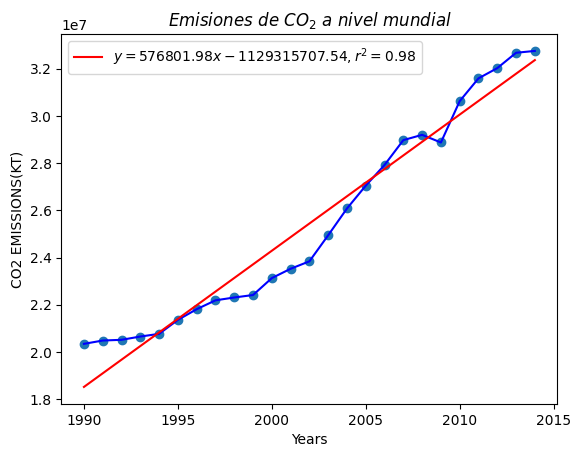

In [ ]:
from scipy.stats import pearsonr
# Cálculo de la línea de tendencia
x=years
y=C02KT
p = np.polyfit(x, y, 1)
trendline = np.polyval(p, x)
r=pearsonr(x, y)
# Creación del gráfico
plt.scatter(x, y)
plt.plot(x,y,color="b")
plt.plot(x, trendline,color='red',label='$y = {:.2f}x {:.2f},r^2={:.2f}$'.format(p[0],p[1],r[0]))
plt.xlabel('Years')
plt.ylabel('CO2 EMISSIONS(KT)')
plt.title('$Emisiones\ de\ CO_2\ a\ nivel\ mundial$')
plt.legend()
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/Emisiones.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
#parametros=[CO2 emissions (kt)	;Electricity production from hydroelectric sources (% of total);Electricity production from oil, gas and coal sources (% of total);
#	Electricity production from renewable sources, excluding hydroelectric (kWh);Fossil fuel energy consumption (% of total);Renewable energy consumption (% of total final energy consumption)]
ERS = [x + y for x, y in zip(np.sum(valores[:,:,1],axis=0),np.sum(valores[:,:,3],axis=0))]

156079004473.7917


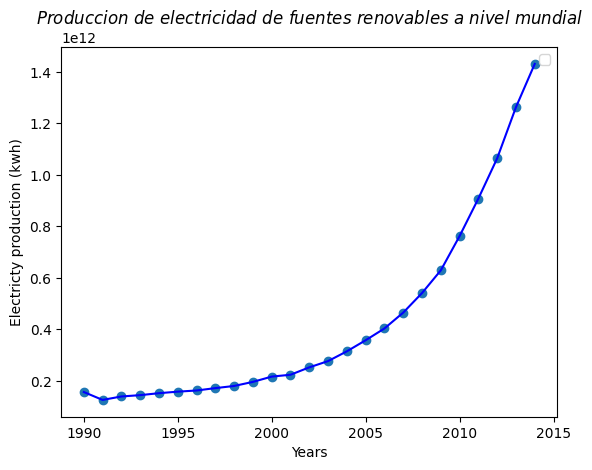

In [ ]:
x=years
y=ERS
# Creación del gráfico
plt.scatter(x, y)
plt.plot(x,y,color="b")
plt.xlabel('Years')
plt.ylabel('Electricty production (kwh)')
plt.title('$Produccion\ de\ electricidad\ de\ fuentes\ renovables\ a\ nivel\ mundial$')
plt.legend()
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/ProduccionElectricidadRenovable.png', dpi=300, bbox_inches='tight')
plt.show()

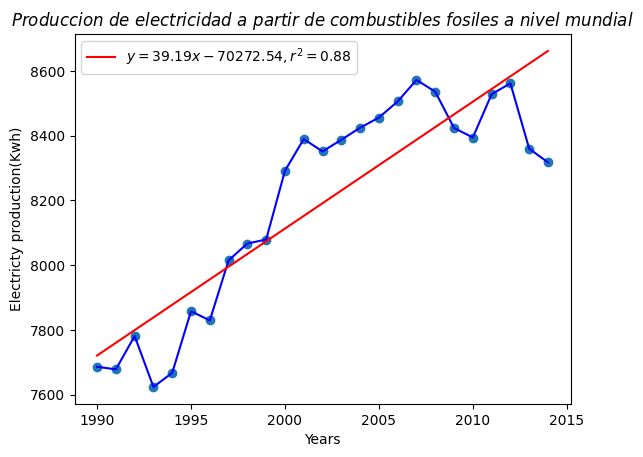

In [ ]:
ERNS=np.sum(valores[:,:,2],axis=0)
from scipy.stats import pearsonr
# Cálculo de la línea de tendencia
x=years
y=ERNS
p = np.polyfit(x, y, 1)
trendline = np.polyval(p, x)
r=pearsonr(x, y)
# Creación del gráfico
plt.scatter(x, y)
plt.plot(x,y,color="b")
plt.plot(x, trendline,color='red',label='$y = {:.2f}x {:.2f},r^2={:.2f}$'.format(p[0],p[1],r[0]))
plt.xlabel('Years')
plt.ylabel('Electricty production(Kwh)')
plt.title('$Produccion\ de\ electricidad\ a\ partir\ de\ combustibles\ fosiles\ a\ nivel\ mundial$')
plt.legend()
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/ProduccionElectricidadNORenovable.png', dpi=300, bbox_inches='tight')
plt.show()

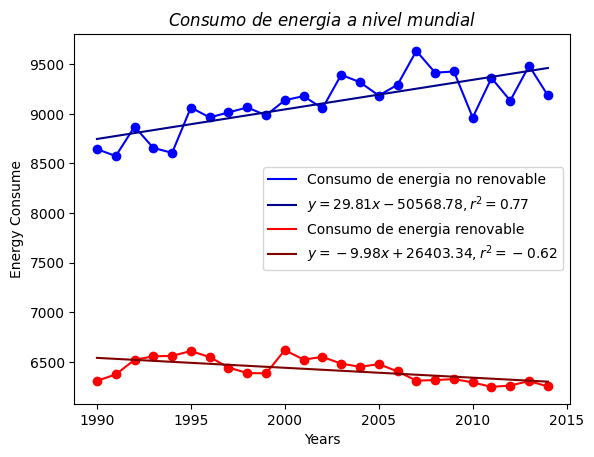

In [ ]:
FEC=np.sum(valores[:,:,4],axis=0)
REC=np.sum(valores[:,:,5],axis=0)
from scipy.stats import pearsonr
# Cálculo de la línea de tendencia
x=years
y=FEC
z=REC
p = np.polyfit(x, y, 1)
trendline = np.polyval(p, x)
r=pearsonr(x, y)
p1= np.polyfit(x,z, 1)
trendline1 = np.polyval(p1, x)
r1=pearsonr(x, z)
# Creación del gráfico
plt.scatter(x,y,color="b")
plt.scatter(x,z,color="r")
plt.plot(x,y,color="b",label="Consumo de energia no renovable")
plt.plot(x, trendline,color='#00008B',label='$y = {:.2f}x {:.2f},r^2={:.2f}$'.format(p[0],p[1],r[0]))
plt.plot(x,z,color="r",label="Consumo de energia renovable")
plt.plot(x, trendline1,color='#800000',label='$y = {:.2f}x+{:.2f},r^2={:.2f}$'.format(p1[0],p1[1],r1[0]))
plt.xlabel('Years')
plt.ylabel('Energy Consume')
plt.title('$Consumo\ de\ energia\ a\ nivel\ mundial$')
plt.legend()
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/ConsumoEnergia.png', dpi=300, bbox_inches='tight')
plt.show()

## mapas coropléticos

In [ ]:
!pip install geopandas

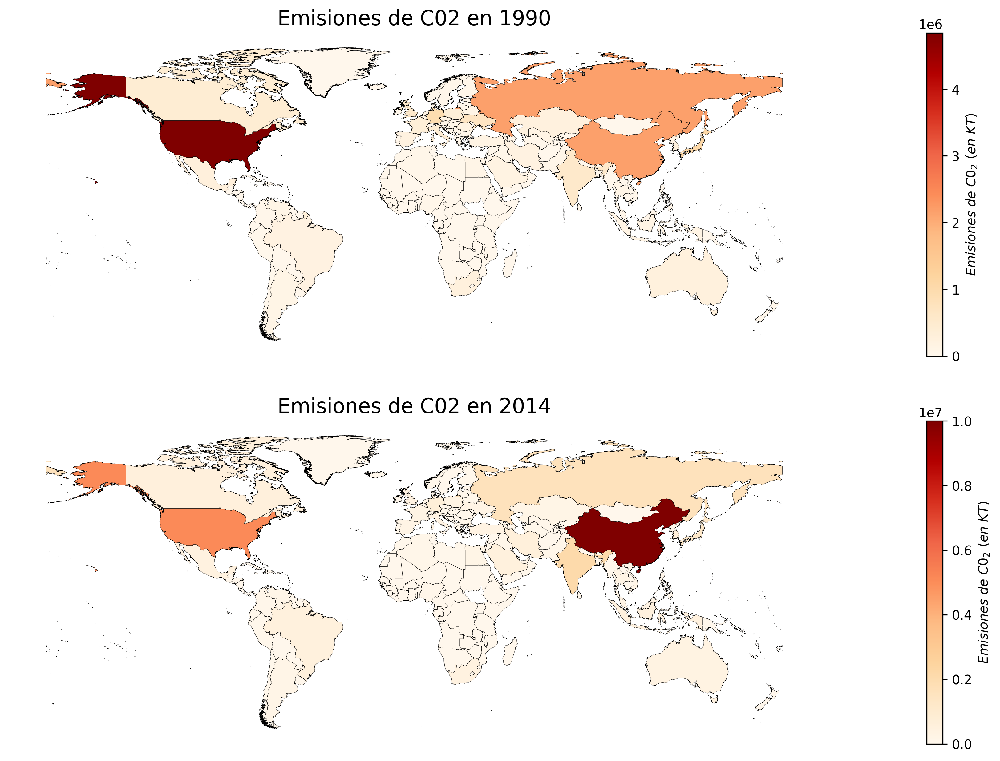

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
# Leer datos del mapa del mundo
world = gpd.read_file(r"/content/drive/MyDrive/Proyecto Big Data/ne_10m_admin_0_countries_usa.shp")
#world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,0]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,0]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Emisiones\ de\ C0_2\ (en\ KT)$"}
merged1.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Emisiones de C02 en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Emisiones de C02 en 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])
#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/Emisionesmundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

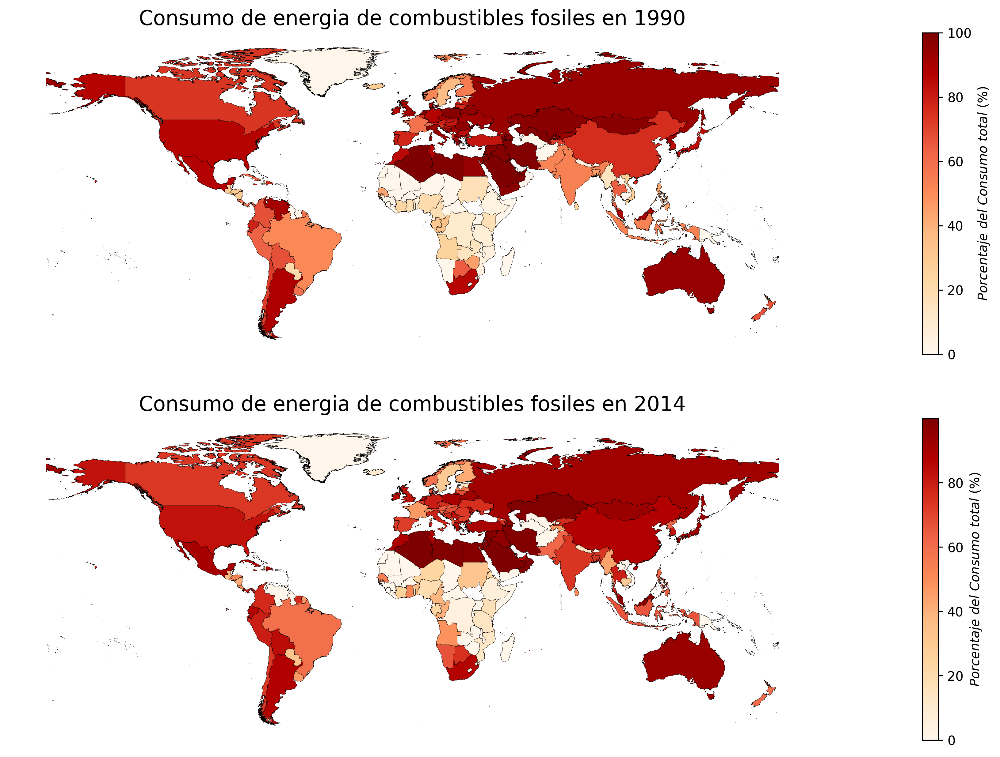

In [ ]:
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,4]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,4]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Porcentaje\ del\ Consumo\ total\ (\%)$"}
merged1.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True, legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Consumo de energia de combustibles fosiles en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Consumo de energia de combustibles fosiles en 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])
#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/consumoenergiamundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

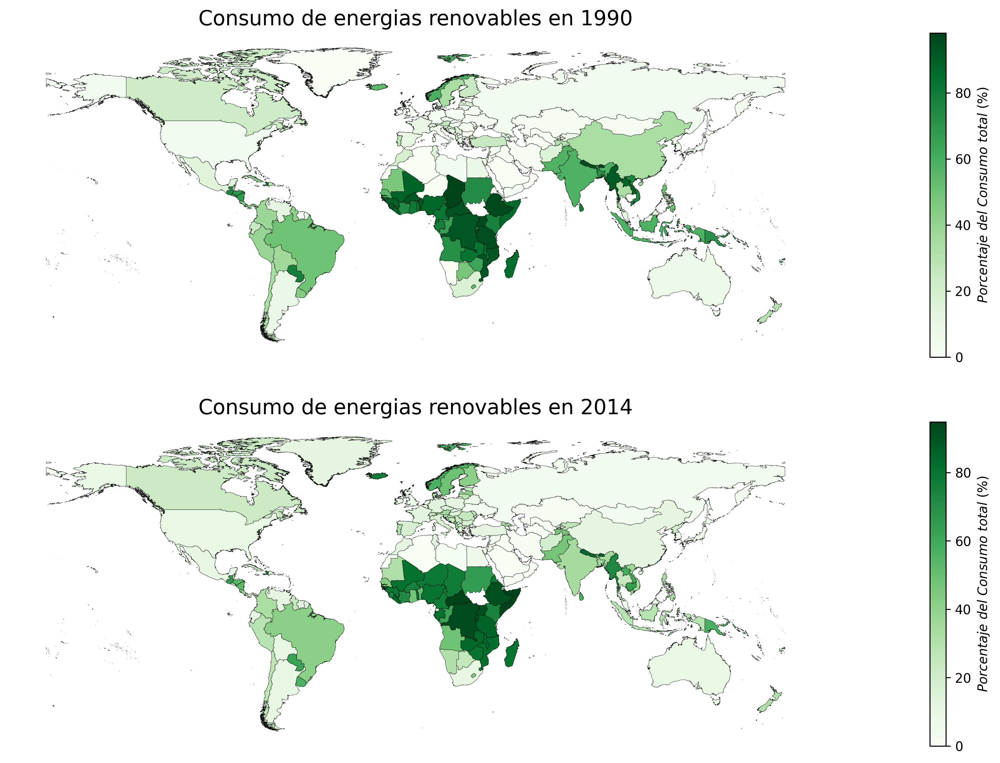

In [ ]:
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,5]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,5]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Porcentaje\ del\ Consumo\ total\ (\%)$"}
merged1.plot(column='valor', cmap='Greens',edgecolor='black',linewidth=0.2, legend=True, legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='Greens',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Consumo de energias renovables en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Consumo de energias renovables en 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])
#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/consumoenergiarenovablemundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

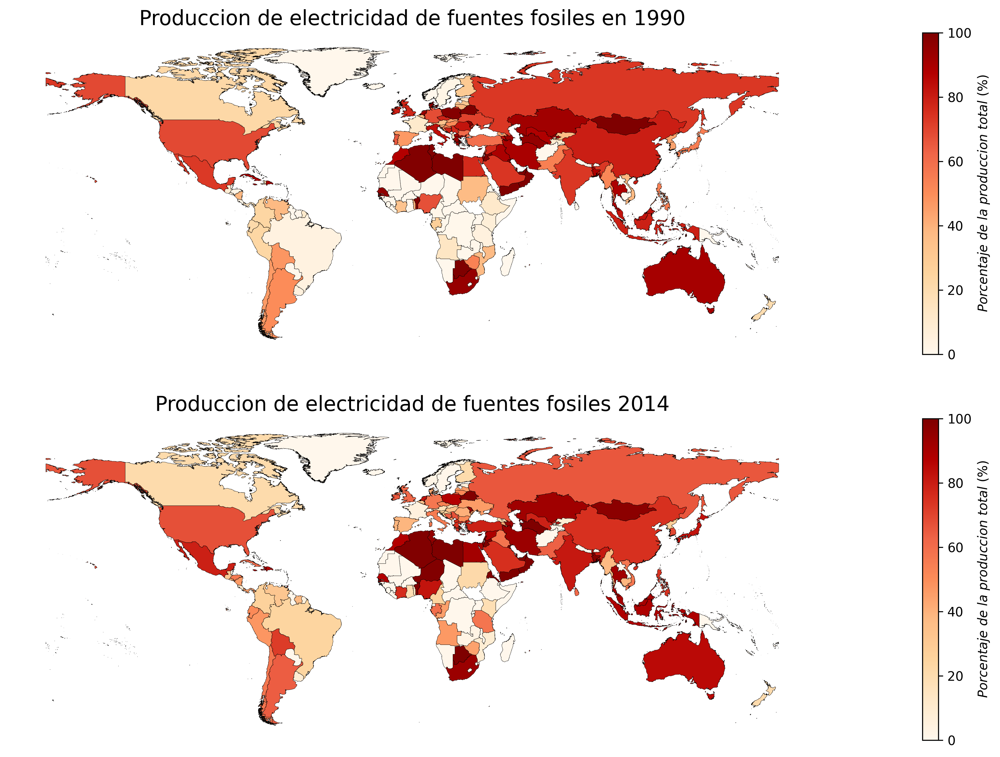

In [ ]:
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,2]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,2]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Porcentaje\ de\ la\ produccion\ total\ (\%)$"}
merged1.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True, legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='OrRd',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Produccion de electricidad de fuentes fosiles en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Produccion de electricidad de fuentes fosiles 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])
#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/produccionefosilesmundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

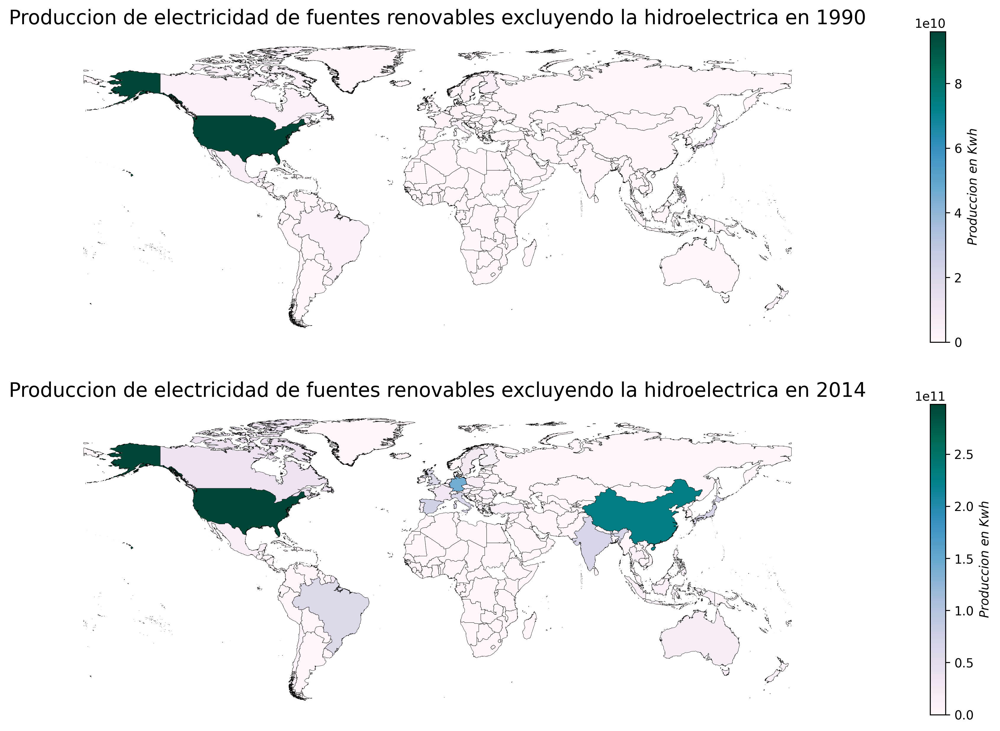

In [ ]:
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,3]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,3]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Produccion\ en\ Kwh$"}
merged1.plot(column='valor', cmap='PuBuGn',edgecolor='black',linewidth=0.2, legend=True, legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='PuBuGn',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Produccion de electricidad de fuentes renovables excluyendo la hidroelectrica en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Produccion de electricidad de fuentes renovables excluyendo la hidroelectrica en 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])
#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/produccionerenovablemundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

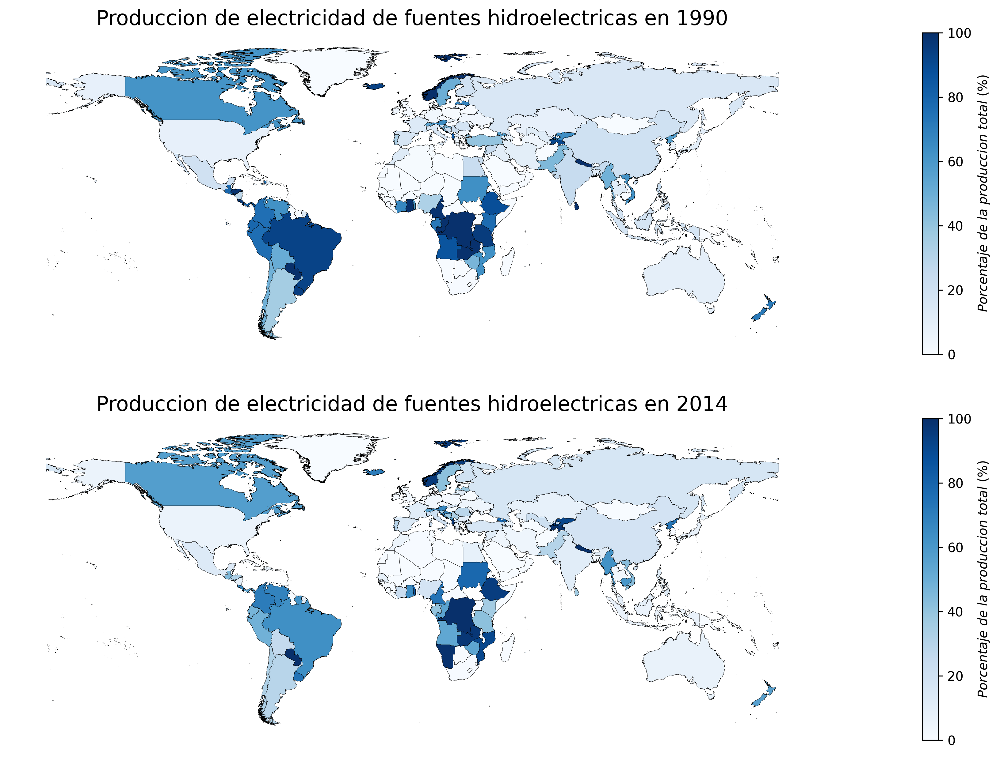

In [ ]:
# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,1]})
data2 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,24,1]})
# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')
merged2 = world.merge(data2,left_on='ADM0_A3', right_on='pais')
# Crear figura y subplots
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(30,10),dpi=300)

# Graficar mapas en cada subplot
legend_kwds={'label': "$Porcentaje\ de\ la\ produccion\ total\ (\%)$"}
merged1.plot(column='valor', cmap='Blues',edgecolor='black',linewidth=0.2, legend=True, legend_kwds=legend_kwds, ax=axs[0])
merged2.plot(column='valor', cmap='Blues',edgecolor='black',linewidth=0.2, legend=True,legend_kwds=legend_kwds, ax=axs[1])

# Configurar título y ejes de cada subplot
axs[0].set_title('Produccion de electricidad de fuentes hidroelectricas en 1990', fontsize=16)
axs[0].set_axis_off()
#axs[0].set_xticks([]),axs[0].set_yticks([])
axs[1].set_title('Produccion de electricidad de fuentes hidroelectricas en 2014', fontsize=16)
axs[1].set_axis_off()
#axs[1].set_xticks([]),axs[1].set_yticks([])

#Guardar Figura
plt.savefig('/content/drive/MyDrive/Proyecto Big Data/produccionerenovablemundial.png', dpi=300, bbox_inches='tight')
# Mostrar figura
plt.show()

##Animacion com matplotlib.animation

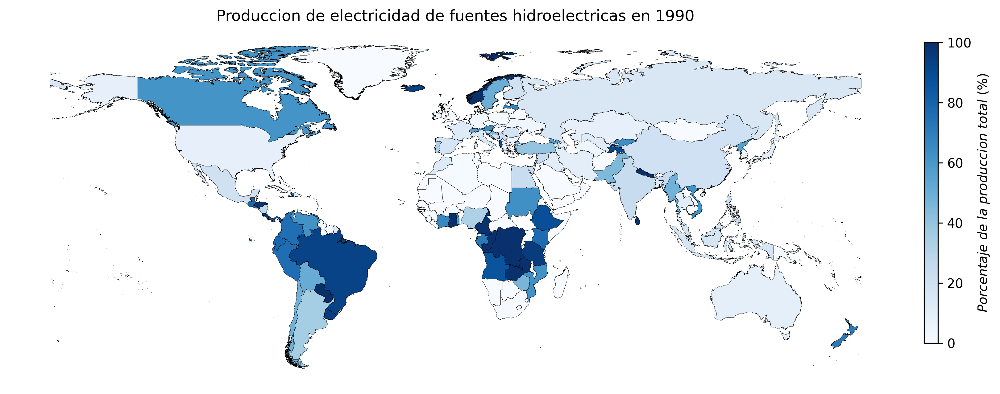

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Leer datos del mapa del mundo
world = gpd.read_file(r"/content/drive/MyDrive/Proyecto Big Data/ne_10m_admin_0_countries_usa.shp")

# Crear dataframe 
data1 = pd.DataFrame({'pais':lista_pais[:],
                      'valor':valores[:,0,1]})

# Unir dataframes por el nombre del país
merged1 = world.merge(data1,left_on='ADM0_A3', right_on='pais')

# Crear figura y subplots
fig, ax = plt.subplots(figsize=(15,5),dpi=300)

# Crear el eje para la colorbar
cax = fig.add_axes([0.85, 0.2, 0.01, 0.65])

# Inicializar la colorbar
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=valores[:,0,1].min(), vmax=valores[:,0,1].max()))
sm._A = []
cbar = fig.colorbar(sm, cax=cax, label="$Porcentaje\ de\ la\ produccion\ total\ (\%)$")

# Función que actualiza el mapa en cada frame
def update_map(frame):
    ax.clear()
    data = pd.DataFrame({'pais':lista_pais[:],
                         'valor':valores[:,frame,1]})
    merged = world.merge(data,left_on='ADM0_A3', right_on='pais')
    merged.plot(column='valor', cmap='Blues',edgecolor='black',linewidth=0.2,ax=ax)
    ax.axis('off')
    ax.set_title(f'Produccion de electricidad de fuentes hidroelectricas en {1990+frame}')
    
    # Actualizar la información en la colorbar
    sm.set_clim(vmin=valores[:,frame,1].min(), vmax=valores[:,frame,1].max())
    sm.set_array(valores[:,frame,1])
    fig.colorbar(sm, cax=cax, label="$Porcentaje\ de\ la\ produccion\ total\ (\%)$")
    plt.pause(0.001)

# Crear la animación
ani = FuncAnimation(fig, update_map, frames=valores.shape[1], interval=500)

In [ ]:
# Mostrar la animación en el notebook
HTML(ani.to_jshtml())

In [ ]:
# Crear la animación como un archivo GIF
ani.save('/content/drive/MyDrive/Proyecto Big Data/Produccionhidroelectricas.gif', writer='imagemagick', fps=2,dpi=300)

# Crear la animación como un archivo MP4
ani.save('/content/drive/MyDrive/Proyecto Big Data/Produccionhidroelectricas.mp4', writer='ffmpeg', fps=2,dpi=300)